# Tassy Detect Deforestation

In [1]:
#General
import glob
import xarray as xr
import rioxarray
import pandas as pd
import geopandas as gpd
import numpy as np
from rasterio import features
from pyproj import Transformer

from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

#DEA tools
import sys
sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import paths_to_datetimeindex, load_ard
from dea_tools.plotting import rgb, display_map
from datacube.utils.cog import write_cog
from dea_tools.spatial import xr_rasterize

#Planetary computer
import pystac_client
import planetary_computer
import matplotlib.pyplot as plt

import datacube
import odc.stac
import odc.geo.xr
from odc.geo.geom import BoundingBox

### Load satellite input dataset
Sentinel1-rct (band-c) with features vv and vh, from the planetary computer

In [2]:
#Connect to datacube
dc = datacube.Datacube(app="Planetary_computer")

In [3]:
# Define the area of interest styx pre site selection (1220840.0143, 1258259.6732) (-4742005.5336,-4762156.5046) EPSG:3577
#longitude =  (1220840.0143, 1258259.6732) #EPSG:3577 VS EPSG:4326 (146.5001688,146.9685348)
#latitude = (-4742005.5336,-4762156.5046) #EPSG:3577 VS EPSG:4326 (-42.7492325,-42.8950499)

# Create a transformer from EPSG:3577 to EPSG:4326
transformer = Transformer.from_crs("EPSG:3577", "EPSG:4326", always_xy=True)

#  bounding box coordinates values in CRS EPSG:3577
left_3577, right_3577 = 1220840, 1258260
bottom_3577, top_3577 = -4762157, -4742006

left_4326, bottom_4326 = transformer.transform(left_3577, bottom_3577)
right_4326, top_4326 = transformer.transform(right_3577, top_3577)

left_4326 = round(left_4326, 4)
bottom_4326 = round(bottom_4326, 4)
right_4326 = round(right_4326, 4)
top_4326 = round(top_4326, 4)

print(left_4326,bottom_4326,right_4326,top_4326)

146.5273 -42.9351 146.9406 -42.7093


In [4]:
display_map(x=(left_4326, right_4326), y=(bottom_4326,top_4326))

In [4]:
# Set the range of dates for the analysis
time = {'t2020': ('2020-04-01','2020-04-30'),
        't2021': ('2021-04-01','2021-04-30'),
        't2022': ('2022-04-01', '2022-04-30'),
        't2023': ('2023-04-01', '2023-04-30')
       }

In [5]:
# Open a pystack client pointing to the Microsoft Planetary Computer data catalogue
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [12]:
#Sentinel1 Load parameters
time_range = "/".join(time.get('t2022'))

# Convert data-cube style queries into something readable by `pystac_client`

#bbox = BoundingBox.from_xy(longitude, latitude)
bbox = BoundingBox(left_4326, bottom_4326, right_4326, top_4326, crs="EPSG:4326")

# Search for STAC items from "sentinel-1-rtc" product
search = catalog.search(
    collections="sentinel-1-rtc", #C-band
    bbox=bbox,
    datetime= time_range,
)

# Check how many items were returned
items = search.item_collection()
print(f"Found {len(items)} STAC items")

Found 2 STAC items


In [14]:
#load Sentinel1 dataset
dask_chunks = {'x': 1000, 'y': 1000}
#Stac Load 
ds1 = odc.stac.load(
    items,
    bbox=bbox,
    assets=["vh","vv"],
    crs="EPSG:3577",
    resolution=20,
    chunks = dask_chunks
)

# Inspect outputs
ds1

<xarray.Dataset> Size: 42MB
Dimensions:      (y: 1410, x: 1871, time: 2)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2022-04-12T19:18:43.645731 2022-04...
Data variables:
    vh           (time, y, x) float32 21MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    vv           (time, y, x) float32 21MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>

In [15]:
#check available time imagery
ds1.coords['time'].values

array(['2022-04-12T19:18:43.645731000', '2022-04-24T19:18:44.521582000'],
      dtype='datetime64[ns]')

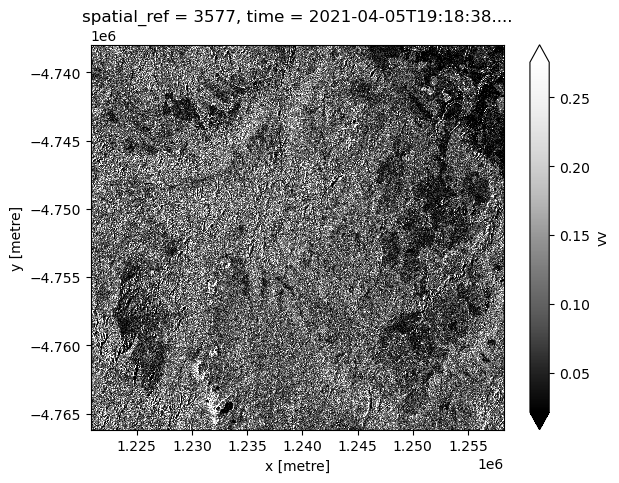

In [12]:
#Visually check Sentinel 1 dataset
ds1.isel(time = [0]).vv.plot(size=5, cmap="Greys_r",robust = True) 

Combine different times imagery into dataset

In [16]:
#First load
#ds_combined = ds1.isel(time = [0]) # run this for the first dataset
#ds_combined = ds_combined.load() #run this for the first dataset: load all data from dask chunks

#subsequent loads (activate this code)
ds1_temporary = ds1.isel(time = [0]) #run this for the subsequent datasets
ds1_temporary = ds1_temporary.load() #run this for the subsequent datasets: load all data from dask chunks
ds_combined = xr.concat([ds_combined, ds1_temporary], dim='time') #run this for the subsequent datasets
del ds1_temporary

#ds_combined times: 2020-04-03T09:09:24.177569,2021-04-05T19:18:38.034485000, 2022-04-12T19:18:43.645731000
#ds1.sel(time = '2021-04-05T19:18:38.034485000')

In [17]:
#inspect dataset
ds_combined

<xarray.Dataset> Size: 42MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2021-04-05T19:18:38.034485 2022-04...
Data variables:
    vh           (time, y, x) float32 21MB 0.007282 0.0104 ... 0.0314 0.02876
    vv           (time, y, x) float32 21MB 0.1108 0.06863 ... 0.1199 0.08348

Process bands: * band scaling to dB

In [18]:
#convert vv and vh bands to decibel scale
def dB_scale(data): 
    '''Scales a xarray.DataArray with linear DN to a dB scale.'''
    # Explicitly set negative data to nan to avoid log of negative number
    negative_free_data = data.where(data >= 0, np.nan)
    return 10 * np.log10(negative_free_data)

In [19]:
ds_combined["vh_dB"] = dB_scale(ds_combined.vh)
ds_combined["vv_dB"] = dB_scale(ds_combined.vv)

In [94]:
ds_combined.vh_dB.values.min()

-33.584946

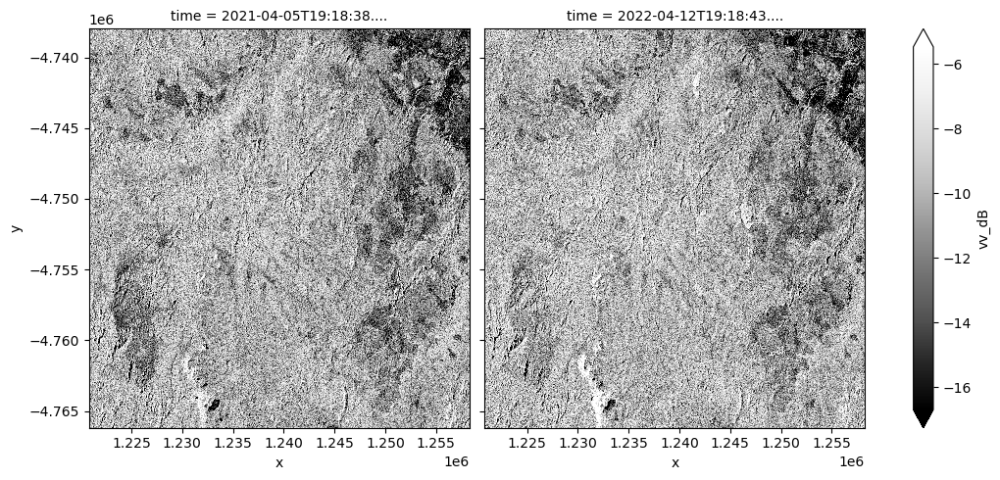

In [20]:
#Visually inspect combined dataset
ds_combined.vv_dB.plot(size=5, cmap="Greys_r",robust = True, col = 'time')

  #ds.vh.sel(time = '2021-04-05T19:18:38.034485000').plot(size=5, cmap="Greys_r",robust = True)

In [4]:
#Visually inspect combined dataset
ds_combined.vh_dB.plot(size=5, cmap="Greys_r",robust = True, col = 'time')

NameError: name 'ds_combined' is not defined

In [23]:
#checkpoint: safe resulting combined dataset to NETcdf
ds_combined.to_netcdf(f"../Project/Outputs/S1RCT20m_combined_2021_2022.nc")

In [19]:
#import created ds_combined if needed
#ds_combined = xr.open_dataset(f"../Project/Outputs/S1RCT20m_combined_2021_2022.nc")

In [20]:
#ds_combined

<xarray.Dataset> Size: 84MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
  * time         (time) datetime64[ns] 16B 2021-04-05T19:18:38.034485 2022-04...
Data variables:
    vh           (time, y, x) float32 21MB ...
    vv           (time, y, x) float32 21MB ...
    spatial_ref  int32 4B ...
    vh_dB        (time, y, x) float32 21MB ...
    vv_dB        (time, y, x) float32 21MB ...

## Import labeled classes dataset

In [21]:
# Load the polygons
class_training_gpd = gpd.read_file('../Project/Inputs/Styx_class_training_polygons/Tas_deforestation_change_202203_202103_Vectorized_area_clean.shp')

In [22]:
#inspect imported geopandas dataframe
class_training_gpd

,defor,Area,geometry
0,0,4300,"POLYGON ((1257680.000 -4742010.000, 1257790.00..."
1,1,4100,"POLYGON ((1241620.000 -4742020.000, 1241640.00..."
2,-1,3600,"POLYGON ((1231630.000 -4742070.000, 1231650.00..."
3,-1,7200,"POLYGON ((1257650.000 -4742010.000, 1257680.00..."
4,-1,3000,"POLYGON ((1248390.000 -4742080.000, 1248400.00..."
...,...,...,...
1408,-1,3500,"POLYGON ((1225320.000 -4762090.000, 1225340.00..."
1409,-1,3800,"POLYGON ((1226130.000 -4762110.000, 1226140.00..."
1410,-1,3100,"POLYGON ((1227090.000 -4762080.000, 1227100.00..."
1411,1,3800,"POLYGON ((1251690.000 -4762090.000, 1251710.00..."


In [38]:
# clean geodataframe 
class_training_gpd = class_training_gpd.drop(columns=['Area'])
class_training_gpd = class_training_gpd.rename(columns={'defor': 'deforestation_class'})
class_training_gpd['deforestation_class'] = class_training_gpd['deforestation_class'].replace({-1: 1, 0: 2, 1: 3})

In [39]:
class_training_gpd.deforestation_class.unique()

array([2, 3, 1])

In [131]:
#Visually inspect geopandas dataframe
class_training_gpd.explore(column='deforestation_class')

In [25]:
ds_combined.vv_dB.isel(time = [1]).rio.crs

CRS.from_epsg(3577)

In [40]:
# Rasterize the polygon geometries ('deforestation_class') onto the raster template from the xarray dataset (ds_clipped)
deforestation_raster = xr_rasterize(
    gdf=class_training_gpd,                         # Your geopandas GeoDataFrame
    da=ds_combined.vv_dB.isel(time = [0]),                     # Your xarray DataArray (vv band), used as the template
    attribute_col='deforestation_class',   # Column in polygons to rasterize (e.g., deforestation class)
    crs=ds_combined.vv_dB.isel(time = [0]).rio.crs,                # Coordinate reference system
    name='deforestation_class',                  # Name of the resulting DataArray
    all_touched = False # Set all_touched to False (default) note: assign value to pixel if the center is contain by the polygon geometry
)

In [41]:
deforestation_raster

<xarray.DataArray 'deforestation_class' (y: 1410, x: 1871)> Size: 21MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577

In [42]:
deforestation_dataset_2022_2021 = deforestation_raster.to_dataset(name='deforestation_class')

In [43]:
deforestation_dataset_2022_2021

<xarray.Dataset> Size: 21MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  (y, x) int64 21MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0

In [45]:
np.unique(deforestation_dataset_2022_2021['deforestation_class'].values)

array([0, 1, 2, 3])

In [48]:
#when rasterizing the polygon the nan values are mapped as 0, then it is required to clean them from our dataset
deforestation_dataset_2022_2021['deforestation_class'] = deforestation_dataset_2022_2021['deforestation_class'].where((deforestation_dataset_2022_2021.deforestation_class == 1) | (deforestation_dataset_2022_2021.deforestation_class == 2) | (deforestation_dataset_2022_2021.deforestation_class == 3))

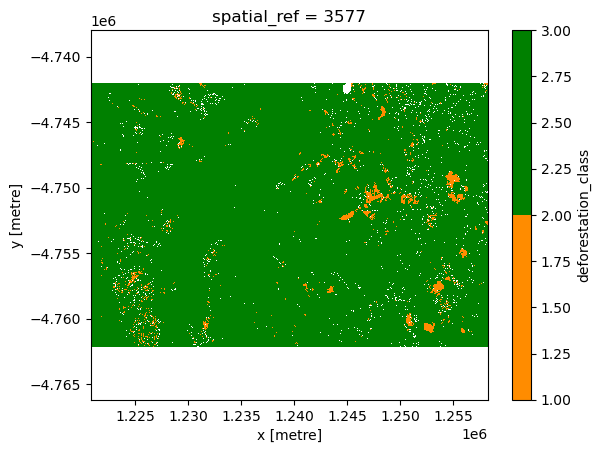

In [49]:
deforestation_dataset_2022_2021['deforestation_class'].plot(cmap=ListedColormap(['darkorange','green']),                                                                                                                                                                                                                 
                                    add_labels=True,
                                    add_colorbar=True)

In [98]:
np.unique(deforestation_dataset_2022_2021['deforestation_class'])

array([-1,  0,  1])

In [50]:
# Write GeoTIFF to a location
write_cog(geo_im=deforestation_dataset_2022_2021['deforestation_class'],
          fname=f'../Project/Outputs/Tas_deforestation_change_class_2022_2021.tif',
          overwrite=True)

PosixPath('../Project/Outputs/Tas_deforestation_change_class_2022_2021.tif')

In [9]:
# Open into an xarray.DataArray
#deforestation_dataset = rioxarray.open_rasterio('../Project/Outputs/Tas_deforestation_class_2022.tif')
#deforestation_dataset

# Covert our xarray.DataArray into a xarray.Dataset
#deforestation_dataset = deforestation_dataset.to_dataset('band')
#deforestation_dataset.rename({1: 'deforestation_class'})
#deforestation_dataset

<xarray.DataArray (band: 1, y: 1410, x: 1871)> Size: 21MB
[2638110 values with dtype=float64]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     nan
    scale_factor:   1.0
    add_offset:     0.0

## Combine reference and satellite datasets

Normal classification: two sentinel1 rct images from 2021 and 2022 will be used to train the RF, then each image will be cliped to the corresponding year reference dataset

In [51]:
# mask sentinel1 dataset (ds_combined) to pixels that have deforestation classes (1,2,3)
mask = 0 #avoid other mask variables to be passed in
mask = (deforestation_dataset_2022_2021.deforestation_class == 1) | (deforestation_dataset_2022_2021.deforestation_class == 2) | (deforestation_dataset_2022_2021.deforestation_class == 3)

deforestation_dataset_2022_2021['deforestation_class'] = deforestation_dataset_2022_2021['deforestation_class'].where(mask)
ds_2022_2021_masked = ds_combined.where(mask)
ds_2022_2021_masked

<xarray.Dataset> Size: 84MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2021-04-05T19:18:38.034485 2022-04...
Data variables:
    vh           (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan
    vv           (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan
    vh_dB        (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan
    vv_dB        (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan

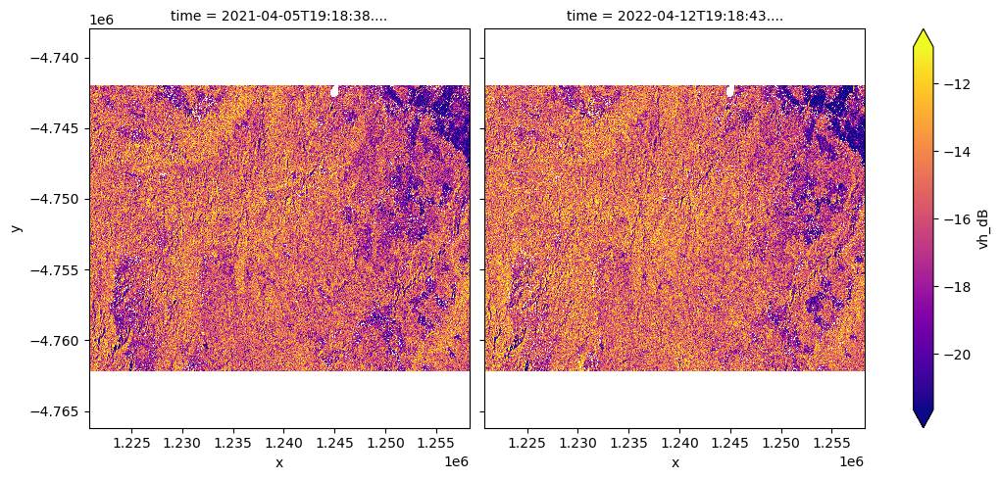

In [52]:
ds_2022_2021_masked.vh_dB.plot(size=5, cmap="plasma",robust = True, col= 'time')

Transform the dataset (ds_2022_2021_masked) to stack bands from different times as additional bands

In [53]:
ds_2022_2021_masked.coords['time'].values

array(['2021-04-05T19:18:38.034485000', '2022-04-12T19:18:43.645731000'],
      dtype='datetime64[ns]')

In [54]:
ds_2021_masked = ds_2022_2021_masked[['vh_dB','vv_dB']].sel(time= '2021-04-05T19:18:38.034485000')
ds_2021_masked = ds_2021_masked.rename({'vh_dB': 't2021_vh_dB'})
ds_2021_masked = ds_2021_masked.rename({'vv_dB': 't2021_vv_dB'})
ds_2021_masked = ds_2021_masked.drop_vars('time')

In [55]:
ds_2022_masked = ds_2022_2021_masked[['vh_dB','vv_dB']].sel(time= '2022-04-12T19:18:43.645731000')
ds_2022_masked = ds_2022_masked.rename({'vh_dB': 't2022_vh_dB'})
ds_2022_masked = ds_2022_masked.rename({'vv_dB': 't2022_vv_dB'})
ds_2022_masked = ds_2022_masked.drop_vars('time')

In [56]:
#inspect splitted datasets
ds_2022_masked

<xarray.Dataset> Size: 21MB
Dimensions:      (y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
Data variables:
    t2022_vh_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    t2022_vv_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan

In [57]:
ds_combined_2021_2022 = xr.merge([ds_2022_masked, ds_2021_masked])
#del ds_2022_masked, ds_2021_masked

In [58]:
ds_combined_2021_2022

<xarray.Dataset> Size: 42MB
Dimensions:      (y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
Data variables:
    t2022_vh_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    t2022_vv_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    t2021_vh_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    t2021_vv_dB  (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan

Add the label class

In [59]:
ds_training = xr.merge([deforestation_dataset_2022_2021,ds_combined_2021_2022])

In [60]:
ds_training

<xarray.Dataset> Size: 63MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  (y, x) float64 21MB nan nan nan nan ... nan nan nan nan
    t2022_vh_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2022_vv_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2021_vh_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2021_vv_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan

In [114]:
print('Total NaN values:',ds_training.isnull().sum(),
      '\n Total non-Nan values: ',ds_training.notnull().sum())

Total NaN values: <xarray.Dataset> Size: 44B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  int64 8B 0
    t2022_vh_dB          int64 8B 0
    t2022_vv_dB          int64 8B 0
    t2021_vh_dB          int64 8B 0
    t2021_vv_dB          int64 8B 0 
 Total non-Nan values:  <xarray.Dataset> Size: 44B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  int64 8B 2638110
    t2022_vh_dB          int64 8B 2638110
    t2022_vv_dB          int64 8B 2638110
    t2021_vh_dB          int64 8B 2638110
    t2021_vv_dB          int64 8B 2638110


In [76]:
#drop all nan values if in any of the datasets
df_training = ds_training.to_dataframe().dropna() 
df_training = df_training.reset_index() #convert indexes into normal columns


In [77]:
df_training

,y,x,spatial_ref,deforestation_class,t2022_vh_dB,t2022_vv_dB,t2021_vh_dB,t2021_vv_dB
0,-4742010.0,1220850.0,3577,2.0,-11.657119,-9.805730,-13.880109,-8.162650
1,-4742010.0,1220870.0,3577,2.0,-13.794384,-8.273807,-14.128236,-8.941134
2,-4742010.0,1220890.0,3577,2.0,-12.357596,-9.406931,-10.928331,-7.389226
3,-4742010.0,1220910.0,3577,2.0,-15.060123,-9.360125,-10.735939,-8.714752
4,-4742010.0,1220930.0,3577,2.0,-14.480587,-11.407005,-14.227582,-8.678105
...,...,...,...,...,...,...,...,...
1856165,-4762150.0,1258170.0,3577,2.0,-16.047743,-11.293829,-16.186396,-11.988062
1856166,-4762150.0,1258190.0,3577,2.0,-18.596756,-11.944909,-17.426908,-13.652224
1856167,-4762150.0,1258210.0,3577,2.0,-18.642960,-12.390970,-16.261843,-12.415542
1856168,-4762150.0,1258230.0,3577,2.0,-18.167637,-12.646369,-17.420418,-11.679038


In [75]:
#df_training_all = pd.concat([df_training_2021, df_training_2022], ignore_index=True)

In [78]:
#df_training_all
df_training_all = df_training
#del df_training

### Process training dataset

In [79]:
df_training_all.drop(columns=['x','y','spatial_ref'], inplace=True)
df_training_all

,deforestation_class,t2022_vh_dB,t2022_vv_dB,t2021_vh_dB,t2021_vv_dB
0,2.0,-11.657119,-9.805730,-13.880109,-8.162650
1,2.0,-13.794384,-8.273807,-14.128236,-8.941134
2,2.0,-12.357596,-9.406931,-10.928331,-7.389226
3,2.0,-15.060123,-9.360125,-10.735939,-8.714752
4,2.0,-14.480587,-11.407005,-14.227582,-8.678105
...,...,...,...,...,...
1856165,2.0,-16.047743,-11.293829,-16.186396,-11.988062
1856166,2.0,-18.596756,-11.944909,-17.426908,-13.652224
1856167,2.0,-18.642960,-12.390970,-16.261843,-12.415542
1856168,2.0,-18.167637,-12.646369,-17.420418,-11.679038


In [80]:
df_training_all.describe()

,deforestation_class,t2022_vh_dB,t2022_vv_dB,t2021_vh_dB,t2021_vv_dB
count,1.856170e+06,1.856170e+06,1.856170e+06,1.856170e+06,1.856170e+06
mean,1.983305e+00,-1.554311e+01,-1.042514e+01,-1.578830e+01,-1.062970e+01
std,1.654117e-01,2.575719e+00,2.614354e+00,2.533790e+00,2.613343e+00
min,1.000000e+00,-3.329054e+01,-2.894265e+01,-3.261588e+01,-2.759818e+01
25%,2.000000e+00,-1.704809e+01,-1.202108e+01,-1.734700e+01,-1.226504e+01
50%,2.000000e+00,-1.535273e+01,-1.029036e+01,-1.562660e+01,-1.048707e+01
75%,2.000000e+00,-1.380660e+01,-8.673497e+00,-1.405217e+01,-8.853142e+00
max,3.000000e+00,5.010395e+00,1.198424e+01,5.415085e+00,1.205726e+01


In [81]:
df_training_all.to_csv('../Project/Outputs/Tas_S1RCT_training_all_change_2021_2022.csv', index=False)

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
#from sklearn.model_selection import StratifiedShuffleSplit
#from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix

In [2]:
#load dataset from csv if required
df_training_all = pd.read_csv('../Project/Outputs/Tas_S1RCT_training_all_change_2021_2022.csv')

In [5]:
#Dataset Checks
#df_training_clean['deforestation_class'].unique()
#df_training_clean.describe()
#df_training_clean.isna().any()

array([1, 2])

In [3]:
# Separate the two classes
class_1 = df_training_all[df_training_all['deforestation_class'] == 1]  # Deforestation
class_2 = df_training_all[df_training_all['deforestation_class'] == 2]  # Non-deforestation
class_3 = df_training_all[df_training_all['deforestation_class'] == 3].replace(3,2)  # map reforestation as Non-deforestation

# Downsample class 2 (non-deforestation)
# len(class_1) gives the number of deforestation instances, which we want to match
class_2_downsampled = class_2.sample(n=len(class_1), random_state=42)

# Combine the downsampled class 2 with the original class 1
balanced_df_training_all = pd.concat([class_1, class_2_downsampled, class_3])

# Shuffle the dataset to mix the classes
balanced_df_training_all = balanced_df_training_all.sample(frac=1, random_state=42).reset_index(drop=True)

# Check the balance of the dataset
print(balanced_df_training_all['deforestation_class'].value_counts())

deforestation_class
2.0    51304
1.0    41146
Name: count, dtype: int64


In [4]:
balanced_df_training_all

,deforestation_class,t2022_vh_dB,t2022_vv_dB,t2021_vh_dB,t2021_vv_dB
0,2.0,-13.747679,-11.591516,-12.761451,-7.906211
1,2.0,-17.294100,-8.850245,-15.470777,-11.140696
2,2.0,-13.080169,-11.262772,-12.458269,-8.910465
3,1.0,-16.117191,-10.682248,-19.793833,-15.130474
4,2.0,-17.505030,-9.608611,-17.862974,-11.516979
...,...,...,...,...,...
92445,1.0,-17.383041,-7.933559,-9.216734,-8.949748
92446,2.0,-17.219408,-11.134511,-16.113132,-9.332238
92447,2.0,-12.175831,-9.056494,-14.626502,-10.371970
92448,1.0,-16.616670,-12.769028,-17.238054,-15.237708


In [5]:
# Separate features and labels
balanced_df_training_all = balanced_df_training_all.rename(columns={
    't2022_vh_dB': 't2_vh_dB',
    't2022_vv_dB': 't2_vv_dB',
    't2021_vh_dB': 't1_vh_dB',
    't2021_vv_dB': 't1_vv_dB'
})

X = balanced_df_training_all[['t2_vh_dB', 't2_vv_dB','t1_vh_dB','t1_vv_dB']]  # Features (VV and VH bands)
y = balanced_df_training_all['deforestation_class']  # Target (deforestation class)

In [6]:
balanced_df_training_all.to_csv('../Project/Outputs/Tas_S1RCT_balance_training_all_bitemporal_2021_2022.csv', index=False)

In [9]:
# Split the dataset
 #random approach 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
y_train.describe()

count    73960.000000
mean         1.554286
std          0.497048
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          2.000000
Name: deforestation_class, dtype: float64

In [120]:
del rf_classifier

NameError: name 'rf_classifier' is not defined

In [11]:
# Create a random forest classifier
rf_classifier = RandomForestClassifier(n_estimators=500,max_features=3, random_state=42, n_jobs = -1) #n_jobs=-1

# Train the classifier on the training data
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(max_features=3, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [13]:
rf_classifier.feature_importances_

array([0.27123524, 0.24073024, 0.24103139, 0.24700313])

In [12]:
#save classifier
import joblib
joblib.dump(rf_classifier, '../Project/Outputs/Classifiers/rf_bitemporal_model.joblib')

['../Project/Outputs/Classifiers/rf_bitemporal_model.joblib']

In [129]:
rf_classifier = joblib.load('../Project/Outputs/Classifiers/rf_bitemporal_model.joblib')

In [130]:
# Predict on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Print classification report
print(classification_report(y_test, y_pred))

Accuracy: 59.62%
              precision    recall  f1-score   support

         1.0       0.55      0.46      0.50      8181
         2.0       0.62      0.70      0.66     10309

    accuracy                           0.60     18490
   macro avg       0.59      0.58      0.58     18490
weighted avg       0.59      0.60      0.59     18490



In [131]:
# Assuming y_test and y_pred are already defined from your model predictions
kappa = cohen_kappa_score(y_test, y_pred)
print(f'Kappa Accuracy: {kappa:.2f}')

Kappa Accuracy: 0.17


In [132]:

confusion_matrix(y_test, y_pred)

array([[3773, 4408],
       [3059, 7250]])

### Inspect training data

In [8]:
df =pd.read_csv('../Project/Outputs/Tas_S1RCT_balance_training_all_bitemporal_2021_2022.csv')
df

,deforestation_class,t2_vh_dB,t2_vv_dB,t1_vh_dB,t1_vv_dB
0,2.0,-13.747679,-11.591516,-12.761451,-7.906211
1,2.0,-17.294100,-8.850245,-15.470777,-11.140696
2,2.0,-13.080169,-11.262772,-12.458269,-8.910465
3,1.0,-16.117191,-10.682248,-19.793833,-15.130474
4,2.0,-17.505030,-9.608611,-17.862974,-11.516979
...,...,...,...,...,...
92445,1.0,-17.383041,-7.933559,-9.216734,-8.949748
92446,2.0,-17.219408,-11.134511,-16.113132,-9.332238
92447,2.0,-12.175831,-9.056494,-14.626502,-10.371970
92448,1.0,-16.616670,-12.769028,-17.238054,-15.237708


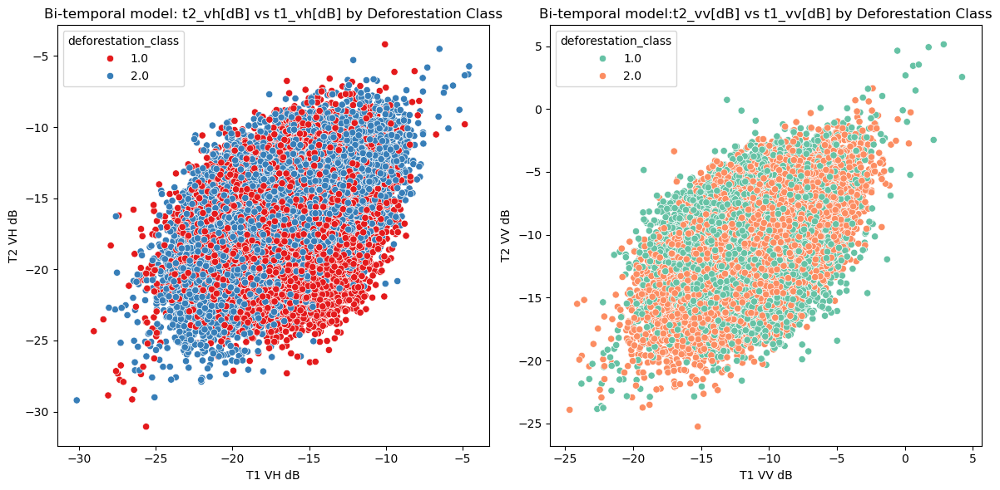

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Scatter plot for t2_vh_dB vs t1_vh_dB, colored by deforestation_class
plt.subplot(1, 2, 1)
sns.scatterplot(x='t1_vh_dB', y='t2_vh_dB', hue='deforestation_class', palette='Set1', data=df)
plt.title('Bi-temporal model: t2_vh[dB] vs t1_vh[dB] by Deforestation Class')
plt.xlabel('T1 VH dB')
plt.ylabel('T2 VH dB')

# Scatter plot for t2_vv_dB vs t1_vv_dB, colored by deforestation_class
plt.subplot(1, 2, 2)
sns.scatterplot(x='t1_vv_dB', y='t2_vv_dB', hue='deforestation_class', palette='Set2', data=df)
plt.title('Bi-temporal model:t2_vv[dB] vs t1_vv[dB] by Deforestation Class')
plt.xlabel('T1 VV dB')
plt.ylabel('T2 VV dB')

plt.tight_layout()
plt.show()